## Step 01: Loading Libraries

In [126]:
# Exploratory Data Analysis
!pip install ydata_profiling
from pandas_profiling import ProfileReport

# Data Processing
import pandas as pd
import numpy as np
import re
from sklearn.impute import SimpleImputer

# Data visualization
!pip install matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Creating the modeling dataset
from sklearn.datasets import make_classification

# Model and performance
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report

# Over sampling and under sampling
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler, NearMiss
from collections import Counter

# Treating data imbalance
!pip install -U imbalanced-learn

## Step 02: Loading dataset

In [127]:
df1 = pd.read_csv('adult_data.csv', header = None, na_values =' ?') # Passing ' ?' as na_values
df2 = pd.read_csv('adult_test.csv', header = None, na_values =' ?') # Passing ' ?' as na_values
df = pd.concat([df1, df2], ignore_index = True)
column_names = ['age', 'workclass', 'fnlwgt', 'education', 'education-num', 'marital-status', 
                'occupation', 'relationship','race', 'gender', 'capital-gain', 'capital-loss', 'hours-per-week',
                'country', 'income']
df.columns = column_names
df.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


## Step 03: Exploratory Data Analysis

In [129]:
EDA = ProfileReport(df, title = "EDA - Base Dataset", html={'style':{'full_width': True}})
EDA

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [132]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,48842.0,38.643585,13.710510,17.0,28.0,37.0,48.0,90.0
fnlwgt,48842.0,189664.134597,105604.025423,12285.0,117550.5,178144.5,237642.0,1490400.0
education-num,48842.0,10.078089,2.570973,1.0,9.0,10.0,12.0,16.0
capital-gain,48842.0,1079.067626,7452.019058,0.0,0.0,0.0,0.0,99999.0
capital-loss,48842.0,87.502314,403.004552,0.0,0.0,0.0,0.0,4356.0
hours-per-week,48842.0,40.422382,12.391444,1.0,40.0,40.0,45.0,99.0


## Step 04: Feature Engineering

## Income

In [12]:
# Target variable has 2 class: <=50K and >50K
# However, due to typo 2 additional classes have been created: <=50K. and >50K.
# So, we are correcting the 'income' class string

df_mod = df.copy()
df_mod['income'] = df_mod['income'].str.replace('<=50K.', '<=50K',regex=False)
df_mod['income'] = df_mod['income'].str.replace('>50K.', '>50K', regex=False)
df_mod['income'].unique()

array([' <=50K', ' >50K'], dtype=object)

#### Converting Income to integer to make further analysis easier

In [17]:
income_map={' <=50K':0,' >50K':1}
df_mod['income']=df_mod['income'].map(income_map).astype(int)
df_mod.income.value_counts()

0    37155
1    11687
Name: income, dtype: int64

## Education

In [18]:
df_mod.education.value_counts()

 HS-grad         15784
 Some-college    10878
 Bachelors        8025
 Masters          2657
 Assoc-voc        2061
 11th             1812
 Assoc-acdm       1601
 10th             1389
 7th-8th           955
 Prof-school       834
 9th               756
 12th              657
 Doctorate         594
 5th-6th           509
 1st-4th           247
 Preschool          83
Name: education, dtype: int64

#### *'Education' variable has 16 categories:*
1. HS-grad: 15784
2. Some-college: 10878
3. Bachelors: 8025
4. Masters: 2657
5. Assoc-voc: 2061
6. 11th: 1812
7. Assoc-acdm: 1601
8. 10th: 1389
9. 7th-8th: 955
10. Prof-school: 834
11. 9th: 756
12. 12th: 657
13. Doctorate: 594
14. 5th-6th: 509
15. 1st-4th: 247
16. Preschool: 83

#### *Hence, we are combining the values of the class in lesser number of categories to derive better prediction into following categorties*
* Pre-school: preschool
* Primary: 1st-4th, 5th-6th
* Junior-High: 7th-8th
* High-school: 11th, 10th, 9th, 12th
* HS-grad: HS-grad
* College: Some-college, Assoc-voc, Assoc-acdm
* Bachelors: Bachelors
* Masters: Masters, Prof-school
* Doctorate: Doctorate

In [19]:
df_mod[['education', 'education-num']].groupby(['education'], as_index=False).mean().sort_values(by='education-num', ascending=False)

,education,education-num
10,Doctorate,16.0
14,Prof-school,15.0
12,Masters,14.0
9,Bachelors,13.0
7,Assoc-acdm,12.0
8,Assoc-voc,11.0
15,Some-college,10.0
11,HS-grad,9.0
2,12th,8.0
1,11th,7.0


In [20]:
df_mod['education'] = df_mod['education'].str.replace('11th','High-school', regex = True)
df_mod['education'] = df_mod['education'].str.replace('9th','High-school', regex = True)
df_mod['education'] = df_mod['education'].str.replace('7th-8th','Junior-High', regex = True)
df_mod['education'] = df_mod['education'].str.replace('5th-6th', 'Primary', regex = True)
df_mod['education'] = df_mod['education'].str.replace('10th','High-school', regex = True)
df_mod['education'] = df_mod['education'].str.replace('1st-4th','Primary', regex = True)
df_mod['education'] = df_mod['education'].str.replace('Preschool','Pre-school', regex = True)
df_mod['education'] = df_mod['education'].str.replace('12th','High-school', regex = True)
df_mod['education'] = df_mod['education'].str.replace('Bachelors','Bachelors', regex = True)
df_mod['education'] = df_mod['education'].str.replace('HS-grad','HS-grad', regex = True)
df_mod['education'] = df_mod['education'].replace(['Masters', 'Prof-school'],'Masters', regex = True)
df_mod['education'] = df_mod['education'].replace(['Some-college','Assoc-acdm', 'Assoc-voc'],'College', regex = True)
df_mod['education'] = df_mod['education'].str.replace('Doctorate','Doctorate', regex = True)
df_mod['education'].unique()

array([' Bachelors', ' HS-grad', ' High-school', ' Masters', ' College',
       ' Junior-High', ' Doctorate', ' Primary', ' Pre-school'],
      dtype=object)

In [23]:
df_mod[['education', 'education-num']].groupby(['education'], as_index=False).mean().sort_values(by='education-num', ascending=False)

,education,education-num
2,Doctorate,16.000000
6,Masters,14.238900
0,Bachelors,13.000000
1,College,10.361967
3,HS-grad,9.000000
4,High-school,6.513654
5,Junior-High,4.000000
8,Primary,2.673280
7,Pre-school,1.000000


## Step 05: Dropping Duplicates

In [24]:
df_mod = df_mod.drop_duplicates()
df_mod.shape

(48790, 15)

## Step 06: Missing Value Treatment

In [25]:
df_mod.isna().sum()

age                  0
workclass         2795
fnlwgt               0
education            0
education-num        0
marital-status       0
occupation        2805
relationship         0
race                 0
gender               0
capital-gain         0
capital-loss         0
hours-per-week       0
country            856
income               0
dtype: int64

In [26]:
df_mod.isna().mean()*100

age               0.000000
workclass         5.728633
fnlwgt            0.000000
education         0.000000
education-num     0.000000
marital-status    0.000000
occupation        5.749129
relationship      0.000000
race              0.000000
gender            0.000000
capital-gain      0.000000
capital-loss      0.000000
hours-per-week    0.000000
country           1.754458
income            0.000000
dtype: float64

The missing values are in 3 categorical variables:
* **workclass**,
* **occupation** and
* **country**

All of these 3 variables are categorical and non-ordinal which is why we cannot convert them into ordinal numeric values to apply multivariate imputer like KNN. We are trying 3 options to impute the missing values:
* **Dropping the 'na' values as they are ~5% and we have a large dataset**
* **Replacing 'na' with 'not available' to avoid any further imabalnce in the datatset**
* **Replacing 'na' with mode**

### *6.1: Removing Missing Values*

In [133]:
x = df_mod.copy()
df_m1 = x.dropna()

In [134]:
df_m1.isna().sum()

age               0
workclass         0
fnlwgt            0
education         0
education-num     0
marital-status    0
occupation        0
relationship      0
race              0
gender            0
capital-gain      0
capital-loss      0
hours-per-week    0
country           0
income            0
dtype: int64

In [31]:
df_m1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45175 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             45175 non-null  int64 
 1   workclass       45175 non-null  object
 2   fnlwgt          45175 non-null  int64 
 3   education       45175 non-null  object
 4   education-num   45175 non-null  int64 
 5   marital-status  45175 non-null  object
 6   occupation      45175 non-null  object
 7   relationship    45175 non-null  object
 8   race            45175 non-null  object
 9   gender          45175 non-null  object
 10  capital-gain    45175 non-null  int64 
 11  capital-loss    45175 non-null  int64 
 12  hours-per-week  45175 non-null  int64 
 13  country         45175 non-null  object
 14  income          45175 non-null  int64 
dtypes: int64(7), object(8)
memory usage: 5.5+ MB


### *6.2: Replacing 'na' with 'not available'*

In [34]:
df_m2 = df_mod.copy()
df_m2.info(show_counts = True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48790 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             48790 non-null  int64 
 1   workclass       45995 non-null  object
 2   fnlwgt          48790 non-null  int64 
 3   education       48790 non-null  object
 4   education-num   48790 non-null  int64 
 5   marital-status  48790 non-null  object
 6   occupation      45985 non-null  object
 7   relationship    48790 non-null  object
 8   race            48790 non-null  object
 9   gender          48790 non-null  object
 10  capital-gain    48790 non-null  int64 
 11  capital-loss    48790 non-null  int64 
 12  hours-per-week  48790 non-null  int64 
 13  country         47934 non-null  object
 14  income          48790 non-null  int64 
dtypes: int64(7), object(8)
memory usage: 6.0+ MB


In [35]:
df_m2['occupation'].fillna('not available', inplace=True)
df_m2['workclass'].fillna('not available', inplace=True)
df_m2['country'].fillna('not available', inplace=True)

In [36]:
df_m2.info(show_counts = True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48790 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             48790 non-null  int64 
 1   workclass       48790 non-null  object
 2   fnlwgt          48790 non-null  int64 
 3   education       48790 non-null  object
 4   education-num   48790 non-null  int64 
 5   marital-status  48790 non-null  object
 6   occupation      48790 non-null  object
 7   relationship    48790 non-null  object
 8   race            48790 non-null  object
 9   gender          48790 non-null  object
 10  capital-gain    48790 non-null  int64 
 11  capital-loss    48790 non-null  int64 
 12  hours-per-week  48790 non-null  int64 
 13  country         48790 non-null  object
 14  income          48790 non-null  int64 
dtypes: int64(7), object(8)
memory usage: 6.0+ MB


### *6.3: Replacing 'na' with mode*

Before replacing 'na' with most frequent value or mode, we will need to split the train-test set as we cannot leak any info to the test set.

In [37]:
df_m3 = df_mod.copy()

In [40]:
ind_var = ['age', 'workclass', 'fnlwgt', 'education', 'education-num',
       'marital-status', 'occupation', 'relationship', 'race', 'gender',
       'capital-gain', 'capital-loss', 'hours-per-week', 'country',] # independent variables
X = df_m3[ind_var] # Features
y = df_m3['income'] # Target variable
X_train_m3, X_test_m3, y_train_m3, y_test_m3 = train_test_split(X, y, test_size=0.3, random_state=40)

In [41]:
# Replacing 'na' with mode only in the training set

X_train_m3['occupation'] = X_train_m3['occupation'].fillna(X_train_m3['occupation'].mode()[0])
X_train_m3['workclass'] = X_train_m3['workclass'].fillna(X_train_m3['workclass'].mode()[0])
X_train_m3['country'] = X_train_m3['country'].fillna(X_train_m3['country'].mode()[0])

In [42]:
X_train_m3.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,country
7174,28,Private,107411,Bachelors,13,Never-married,Prof-specialty,Not-in-family,White,Female,0,0,35,United-States
26712,70,Private,89787,HS-grad,9,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,20,United-States
41840,80,Self-emp-inc,164909,Masters,14,Married-civ-spouse,Exec-managerial,Husband,White,Male,99999,0,54,United-States
29718,33,Self-emp-not-inc,170979,Masters,15,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,1887,40,United-States
3565,34,Private,157165,College,10,Divorced,Other-service,Unmarried,White,Female,0,0,40,United-States


In [43]:
# removing the 'na' values from test set for df_ModeImpute

X_train_m3 = X_train_m3.dropna()
X_train_m3.isna().sum()

age               0
workclass         0
fnlwgt            0
education         0
education-num     0
marital-status    0
occupation        0
relationship      0
race              0
gender            0
capital-gain      0
capital-loss      0
hours-per-week    0
country           0
dtype: int64

#### For categorical non-ordinal values, mode imputation does not make much sense as it does not add any value to the data. As a result, we will not proceed with mode imputation. We will limit our analysis and model building between df_m1 (removing na values) and df_m2 (keeping the na values as 'not avaialable' class)

## Step 07: Comparing EDA of original and transformed datasets

In [135]:
EDA_modified1 = ProfileReport(df_m1, title="EDA - df_m1 (removed na values)")
comparison_report = EDA.compare(EDA_modified1)
comparison_report.to_file("original_vs_transformed.html")
comparison_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [136]:
EDA_modified2 = ProfileReport(df_m2, title="EDA - df_m2 (keeping na values as 'not available')")
comparison_report = EDA.compare(EDA_modified2)
comparison_report.to_file("original_vs_transformed.html")
comparison_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Step 7: Treating Class Imbalance

Target variable of this dataset is imbalanced, which makes the dataset imbalanced.
We will need to treat the class imbalance before building model

In [51]:
df_m1['income'].value_counts(normalize = True)

0    0.752031
1    0.247969
Name: income, dtype: float64

In [52]:
df_m2['income'].value_counts(normalize = True)

0    0.760586
1    0.239414
Name: income, dtype: float64

### *7.1: Data Encoding*

First we will need to encode our categorical string data as we won't be able to build model on that. Otherwise, machine learning model will give us  error because of the string values and machine learning models cannot work on categorical string values. So we will need to convert the categorical string features to numerical values. 
It can be done either OneHotEncoding or through Pandas get_dummies function.

In [54]:
# before encoding, we will separate the numerical features in a dataframe 
# as we will need to merge them with encoded columns later

# Encoding df_m1 dataset

df_m1_num = df_m1.drop(['workclass', 'education', 'marital-status', 'occupation', 'relationship', 'race', 'gender', 'country'], axis=1)
df_encoded1 = pd.get_dummies(df_m1[['workclass', 'education', 'marital-status', 'occupation', 'relationship', 'race', 'gender', 'country']],)
df_encoded1 = pd.concat([df_encoded1, df_m1_num], axis=1)
df_encoded1

,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ Bachelors,education_ College,education_ Doctorate,...,country_ United-States,country_ Vietnam,country_ Yugoslavia,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,income
0,0,0,0,0,0,1,0,1,0,0,...,1,0,0,39,77516,13,2174,0,40,0
1,0,0,0,0,1,0,0,1,0,0,...,1,0,0,50,83311,13,0,0,13,0
2,0,0,1,0,0,0,0,0,0,0,...,1,0,0,38,215646,9,0,0,40,0
3,0,0,1,0,0,0,0,0,0,0,...,1,0,0,53,234721,7,0,0,40,0
4,0,0,1,0,0,0,0,1,0,0,...,0,0,0,28,338409,13,0,0,40,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48836,0,0,1,0,0,0,0,1,0,0,...,1,0,0,33,245211,13,0,0,40,0
48837,0,0,1,0,0,0,0,1,0,0,...,1,0,0,39,215419,13,0,0,36,0
48839,0,0,1,0,0,0,0,1,0,0,...,1,0,0,38,374983,13,0,0,50,0
48840,0,0,1,0,0,0,0,1,0,0,...,1,0,0,44,83891,13,5455,0,40,0


In [55]:
# Encoding df_m2 dataset

df_m2_num = df_m2.drop(['workclass', 'education', 'marital-status', 'occupation', 'relationship', 'race', 'gender', 'country'], axis=1)
df_encoded2 = pd.get_dummies(df_m2[['workclass', 'education', 'marital-status', 'occupation', 'relationship', 'race', 'gender', 'country']],)
df_encoded2 = pd.concat([df_encoded2, df_m2_num], axis=1)
df_encoded2

,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,workclass_not available,education_ Bachelors,...,country_ Vietnam,country_ Yugoslavia,country_not available,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,income
0,0,0,0,0,0,0,1,0,0,1,...,0,0,0,39,77516,13,2174,0,40,0
1,0,0,0,0,0,1,0,0,0,1,...,0,0,0,50,83311,13,0,0,13,0
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,38,215646,9,0,0,40,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,53,234721,7,0,0,40,0
4,0,0,0,1,0,0,0,0,0,1,...,0,0,0,28,338409,13,0,0,40,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,0,0,0,1,0,0,0,0,0,1,...,0,0,0,39,215419,13,0,0,36,0
48838,0,0,0,0,0,0,0,0,1,0,...,0,0,0,64,321403,9,0,0,40,0
48839,0,0,0,1,0,0,0,0,0,1,...,0,0,0,38,374983,13,0,0,50,0
48840,0,0,0,1,0,0,0,0,0,1,...,0,0,0,44,83891,13,5455,0,40,0


### *7.2: Train-Test Split*

In [57]:
# Train-test split for df_encoded1 dataset (encoded from df_m1 dataset)

X = df_encoded1.drop('income', axis=1) # all independent variables execpt the target 'income'
y = df_encoded1['income'] # Target variable
X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y, test_size=0.3)
print("The number of records in the training set is", X_train1.shape[0])
print("The number of records in the test set is", X_test1.shape[0])

The number of records in the training set is 31622
The number of records in the test set is 13553


In [59]:
# Train-test split for df_encoded2 dataset (encoded from df_m2 dataset)

X = df_encoded2.drop('income', axis=1) # all independent variables execpt the target 'income'
y = df_encoded2['income'] # Target variable
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y, test_size=0.3)
print("The number of records in the training set is", X_train2.shape[0])
print("The number of records in the test set is", X_test2.shape[0])

The number of records in the training set is 34153
The number of records in the test set is 14637


### *7.3: Deciding the performance metrics*

Before building the model, we need to decide on the performance metric we would like to optmize and compare different models based on that.

* **Accuracy**: First parameter will be accuracy. As we are treating the imbalance in our dataset, accuracy can be a good measurement for model performance

* **Recall**: Recall is the % of true positives that were picked up from the total postitives by the model (TP/TP+FN). For our dataset we would like to maximize the recall as we want to increase the % of TP being predicted correctly by the model.

Recall, precision and F1 score mainly focus on the positive class (majority class) and do not take TN into consideration much which is why they do not always show the quality of the model if there is a class imbalance in the datatset. Which is why we are going to explore MCC score (Mathew's Correlation Coefficient)

In MCC calculation, the true class and the predicted class are treated as two (binary) variables, and their correlation coefficient are claculated. The higher this correlation between true and predicted values, the accurate the model is. 

MCC = (TPxTN)-(FPxFN) / sqrt{(TP+FP)(TP+FN)(TN+FP)(TN+FN)}

When the model is perfect (FP = FN = 0) the value of MCC is 1, which indicates the perfect positive correlation. When TP = TN = 0 the MCC is -1 which shows perfect negative correlation which means the model is imperfect.

### *7.4: Baseline Model*

Before class imbalance treatment, we will first build a reference model on the base dataset (df_encoded1 and df_encoded2). Once we have the baseline, we will then treat the data imbalance and compare our results against the baseline model.

In [62]:
# Check the number of majority and minority class

print("Majority and minority class y_train1:",(sorted(Counter(y_train1).items())))
print("Majority and minority class y_train2",(sorted(Counter(y_train2).items())))

Majority and minority class y_train1: [(0, 23820), (1, 7802)]
Majority and minority class y_train2 [(0, 25981), (1, 8172)]


              precision    recall  f1-score   support

           0       0.88      0.93      0.90     10153
           1       0.74      0.62      0.67      3400

    accuracy                           0.85     13553
   macro avg       0.81      0.77      0.79     13553
weighted avg       0.84      0.85      0.85     13553



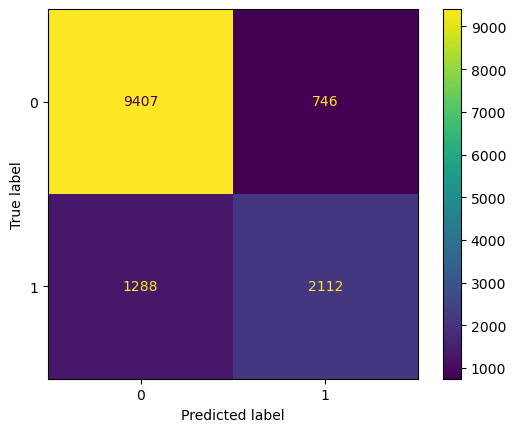

In [110]:
# Random Forest Classifier on df_encoded1 data

cf = RandomForestClassifier()
X_train = X_train1
X_test = X_test1
y_train = y_train1
y_test = y_test1

model = cf.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Check the model performance
print(classification_report(y_test, y_pred))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, values_format = '') # values_format to suppress scientific notation
plt.show()

Class 1 has a recall of 62% only whereas majority class 0 has 93% recall

              precision    recall  f1-score   support

           0       0.89      0.93      0.91     11128
           1       0.73      0.62      0.67      3509

    accuracy                           0.85     14637
   macro avg       0.81      0.77      0.79     14637
weighted avg       0.85      0.85      0.85     14637



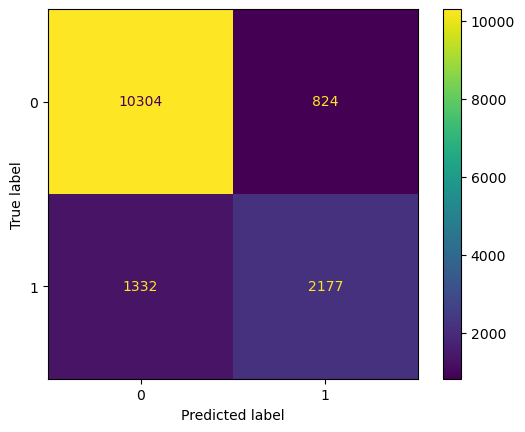

In [109]:
# Random Forest Classifier on df_encoded2 data

cf = RandomForestClassifier()
X_train = X_train2
X_test = X_test2
y_train = y_train2
y_test = y_test2

model = cf.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Check the model performance
print(classification_report(y_test, y_pred))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, values_format = '') # values_format to suppress scientific notation
plt.show()

Class 1 has a recall of 62% only whereas majority class 0 has 93% recall

### *7.4: Treating Class Imbalance*

We are going to explore the following 4 approaches to treat the class imbalance of the dataset:
* **Random Oversampling**
* **SMOTE (Synthetic Minority Oversampling Technique) Oversampling**
* **Random Under-sampling**
* **Near Miss Under-Sampling**

### *7.4.1: Random OverSampling*

We are going to apply our class imbalance treatment techniques to training dataset only. We cannot do it on test set otherwise it will leak information to the test which will result in incorrect or biased outcome. In Random Over-Sampling, we generate new samples for the minority class by sampling with replacement. We will use the RandomOverSampler from imblearn library for this random oversampling.

In [113]:
y_train1.value_counts()

0    23820
1     7802
Name: income, dtype: int64

In [111]:
# Randomly oversample the minority class training set (with randomization) on X_train1 and y_train1

ros = RandomOverSampler()
X_train_ros1, y_train_ros1 = ros.fit_resample(X_train1, y_train1)

# Check the number of records after over sampling
print(sorted(Counter(y_train_ros1).items()))

[(0, 23820), (1, 23820)]


              precision    recall  f1-score   support

           0       0.90      0.90      0.90     10153
           1       0.69      0.69      0.69      3400

    accuracy                           0.84     13553
   macro avg       0.79      0.79      0.79     13553
weighted avg       0.84      0.84      0.84     13553



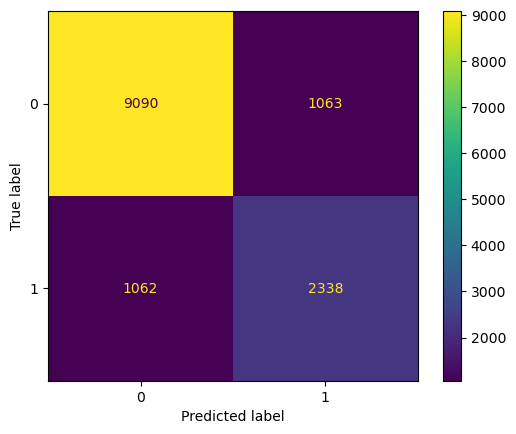

In [112]:
# Rerun Random Forest Classifier

cf = RandomForestClassifier()
X_train = X_train_ros1
X_test = X_test1
y_train = y_train_ros1
y_test = y_test1

model = cf.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Check the model performance
print(classification_report(y_test, y_pred))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, values_format = '') # values_format to suppress scientific notation
plt.show()

very minimal improvement

### *7.4.2: SMOTE OverSampling*

SMOTE (Synthetic Minority Oversampling Technique) was published in 2002. Instead of randomly oversampling with replacement, SMOTE takes each minority sample and introduces synthetic data points connecting the minority sample and its nearest neighbours. Neighbours from the k nearest neighbours are chosen randomly.

In [115]:
y_train1.value_counts()

0    23820
1     7802
Name: income, dtype: int64

In [116]:
# Oversampling the minority class through SMOTE

smote1 = SMOTE()
X_train_smote1, y_train_smote1 = smote1.fit_resample(X_train1, y_train1)

# Check the number of records after over sampling
print(sorted(Counter(y_train_smote1).items()))

[(0, 23820), (1, 23820)]


Similar to random oversampling, the minority class increased from 7802 to 23820, which is the same as majority category.

              precision    recall  f1-score   support

           0       0.89      0.91      0.90     10153
           1       0.72      0.66      0.69      3400

    accuracy                           0.85     13553
   macro avg       0.80      0.79      0.79     13553
weighted avg       0.85      0.85      0.85     13553



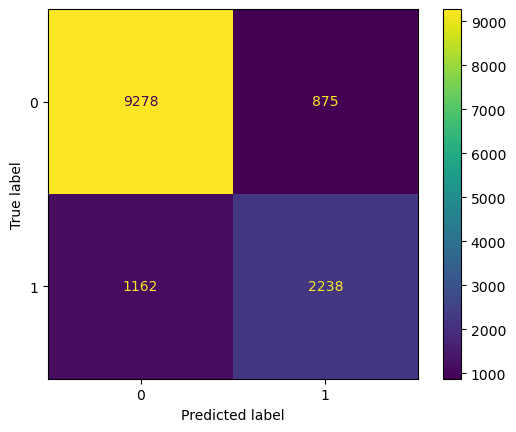

In [117]:
# Rerun Random Forest Classifier

cf = RandomForestClassifier()
X_train = X_train_smote1
X_test = X_test1
y_train = y_train_smote1
y_test = y_test1

model = cf.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Check the model performance
print(classification_report(y_test, y_pred))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, values_format = '') # values_format to suppress scientific notation
plt.show()

Not much improvement has been noticed in SMOTE either; accuracy improved by 1%

### *7.4.3: Random UnderSampling*

Random undersampling randomly picks data points from the majority class. After the sampling, the minority class has the same number of the data points as the majority class.

In [118]:
y_train1.value_counts()

0    23820
1     7802
Name: income, dtype: int64

In [120]:
# Randomly under sample the majority class

rus1 = RandomUnderSampler(random_state=40)
X_train_rus1, y_train_rus1 = rus1.fit_resample(X_train1, y_train1)

# Check the number of records after random undersampling
print(sorted(Counter(y_train_rus1).items()))

[(0, 7802), (1, 7802)]


We can see that, after random undersampling the majority class has been deceased to 7835 which is the same as the minority class.

              precision    recall  f1-score   support

           0       0.94      0.80      0.86     10153
           1       0.58      0.83      0.69      3400

    accuracy                           0.81     13553
   macro avg       0.76      0.82      0.77     13553
weighted avg       0.85      0.81      0.82     13553



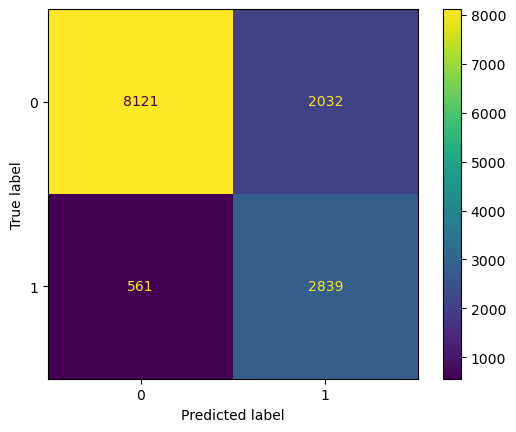

In [121]:
# Rerun Random Forest Classifier

cf = RandomForestClassifier()
X_train = X_train_rus1
X_test = X_test1
y_train = y_train_rus1
y_test = y_test1

model = cf.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Check the model performance
print(classification_report(y_test, y_pred))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, values_format = '') # values_format to suppress scientific notation
plt.show()

Recall of majority class has improved significantly

### *7.4.4: Under Sampling Using NearMiss*

NearMiss from imblearn library uses the KNN(K Nearest Neighbours) to do the undersampling.
Based on the documentation of imblearn library, there are 3 versions of NearMiss algorithms:
* "NearMiss-1 selects the positive samples for which the avg distance to the N closest samples of the negative class is the smallest."
* "NearMiss-2 selects the positive samples for which the avg distance to the N farthest samples of the negative class is the smallest."
* "NearMiss-3 is a 2-steps alogorithm. First, for each negative sample, their M nearest-neighbours will be kept. Then, the positive samples selected are the one for which average distance to the N nearest-neighbours is the largest."

We are using version 3, where for each datapoint in minority class K nearest neighbours are sampled. Then, for each majority datapoints that have been sampled, we calculate the average distance between their N nearest neighbours. The the datapoints with largest average distance are taken as sample.

In [122]:
y_train1.value_counts()

0    23820
1     7802
Name: income, dtype: int64

In [123]:
# Under-sampling the majority class using NearMiss

nearmiss1 = NearMiss(version=3)
X_train_nearmiss1, y_train_nearmiss1 = nearmiss1.fit_resample(X_train1, y_train1)

# Check the number of records after random undersampling
print(sorted(Counter(y_train_nearmiss1).items()))

[(0, 7802), (1, 7802)]


              precision    recall  f1-score   support

           0       0.93      0.81      0.86     10153
           1       0.59      0.82      0.68      3400

    accuracy                           0.81     13553
   macro avg       0.76      0.81      0.77     13553
weighted avg       0.84      0.81      0.82     13553



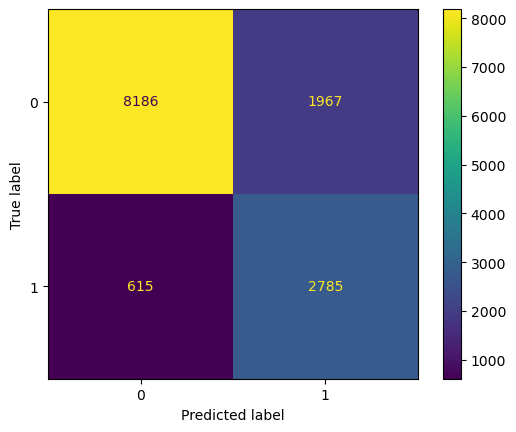

In [124]:
# Rerun Random Forest Classifier

cf = RandomForestClassifier()
X_train = X_train_nearmiss1
X_test = X_test1
y_train = y_train_nearmiss1
y_test = y_test1

model = cf.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Check the model performance
print(classification_report(y_test, y_pred))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, values_format = '') # values_format to suppress scientific notation
plt.show()

Similar performance to Random Undersampling

### Going forward, we will build different ML models on the above 4 approaches and compare results. As we did not see any change in removing na values or keeping the na values, we will go forward with the first approach which is the na removed dataset.